# Energy spectra in 2D

In [1]:
import os
import sys
import gc
import math as m
import numpy as np
import scipy
import pandas as pd
import pylab
from scipy import *
from scipy.signal import butter, filtfilt, hilbert
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
sys.path.append('/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence')
sys.path.append('/projects/DEIKE/cmartinb/functions')
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import * 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pylab
import numpy as np
from scipy.signal import find_peaks
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable


import matplotlib.tri as mtri
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy.interpolate
os.chdir('/projects/DEIKE/cmartinb/')

In [2]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)


In [3]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p16' # 0p16 
uoc = '0p50' # 0p50 0p75

#Common parameters 
kp = 4
u = 0.5
lambdap = 2*m.pi/kp
Re_water = 2.5 * 10**4
L0 = 2*np.pi; N = 512;

ak, c, omegap, nu_water, g , uoc_val= calculate_parameters(kpHs, uoc , u ,kp)
print('ak is', ak, 'c is' ,c, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g)

ak is 0.16 c is 1.0 w_p$ is 2.0 $
u_w$ is 6.283185307179586e-05 g is 1


In [4]:
work_dir = f'/projects/DEIKE/nscapin/broadband/kpHs{kpHs}_uoc{uoc}/'
data = np.loadtxt(work_dir+'eta/global_int.out')

istep_c =data[:, 1]
time = data[:,0] 

In [5]:
tstart = time[0]

In [6]:
eta_series = np.load(f'/projects/DEIKE/cmartinb/eta/eta_series_kpHs{kpHs}_uoc{uoc}.npy', allow_pickle=True)
print(eta_series.shape)
print(time.shape)

(473, 512, 512)
(473,)


In [7]:
indice = np.argmax(omegap*(time - tstart) > 5)
print(indice)

eta_series_trimmed = eta_series[indice:, :]

print(eta_series_trimmed.shape)
time = time[indice:]

eta_series = eta_series_trimmed
print(time.shape)

26
(447, 512, 512)
(447,)


# $\eta(x,y)$

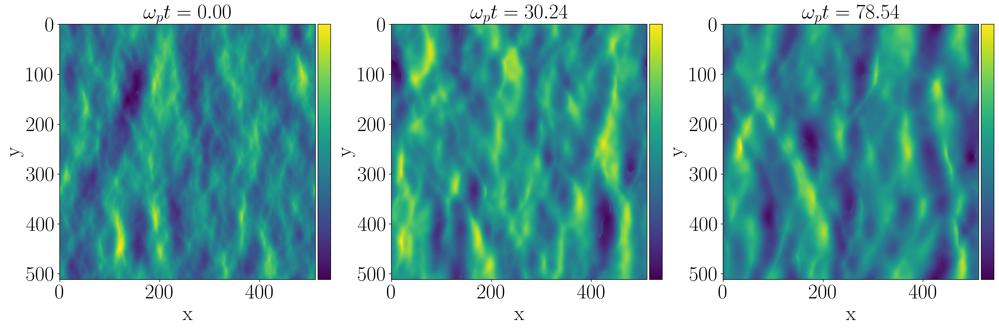

In [12]:
ind_time = [0,154,400] #index of the times we are interested in (depends on length of time) 
num_rows = 1
num_cols = 3

kp = 4; omegap = (1*kp)**0.5

tstart=time[0]


fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 13))
j = 0

N = 512
L = 2 * np.pi


for i in ind_time:
    eta = eta_series[i]
    
    #vmin = 0
    #vmax = 5
    #levels = np.linspace(vmin, vmax, 1000)
    
    ax = axes[j % num_cols]
    im = ax.imshow(eta)  
    
    ax.set_aspect('equal')
    ax.set_title(label=r'$\omega_{p} t=%.2f$'%(omegap*(time[i]-tstart)))
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False')

    
    #cbar = fig.colorbar(im, ax=axs, pad=0.04, orientation='vertical',  extendrect = 'False', shrink= 0.6)
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    ax.figure.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/eta_{(omegap*(time[i]-tstart))}.png')
    
    j += 1
    
plt.tight_layout()
plt.show()

# $E(k_x, k_y)$

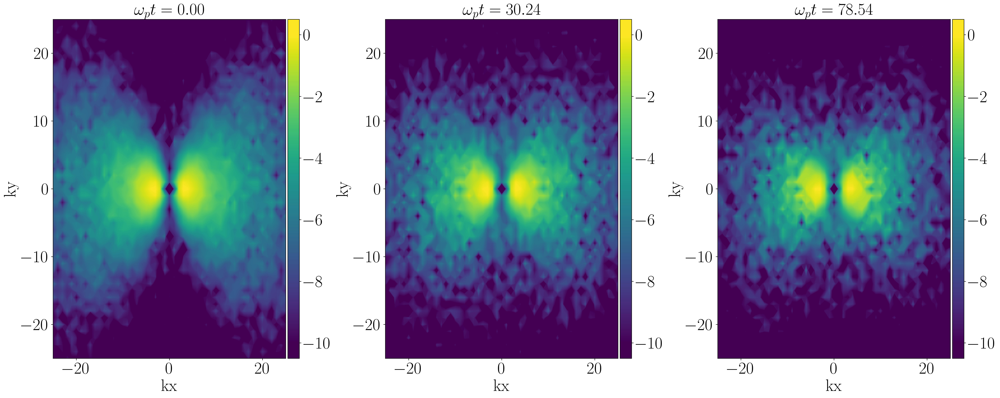

In [14]:
num_rows = 1
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(25, 10))
j = 0

N = 512
L = 2 * np.pi
lim = 200

for i in ind_time:
    
    eta = eta_series[i]
    
    k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, variance, integral, polar_integral, kx, ky = spectrum_integration(eta - np.mean(eta), N, L, CHECK=False) #ypu can chose to check the normalization
    
    norm = np.argmax(F_center)
    
    vmin = -10
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    
    ax = axes[j % num_cols]
    
    im = ax.contourf(kx, ky, np.log(F_center/np.max(F_center)), extend='both', levels=levels)
    
    #ax.set_aspect('equal')
    ax.set_title(label=r'$\omega_{p} t=%.2f$' % (omegap * (time[i] - tstart)))
    ax.set_xlabel('kx')
    ax.set_ylabel('ky')
    ax.set_ylim([-25, 25])
    ax.set_xlim([-25, 25])
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False')
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    #cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    ax.figure.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/Ekxky_{(omegap*(time[i]-tstart))}.png')
    j += 1
    
plt.tight_layout()
plt.show()

# $E(k, \theta)$

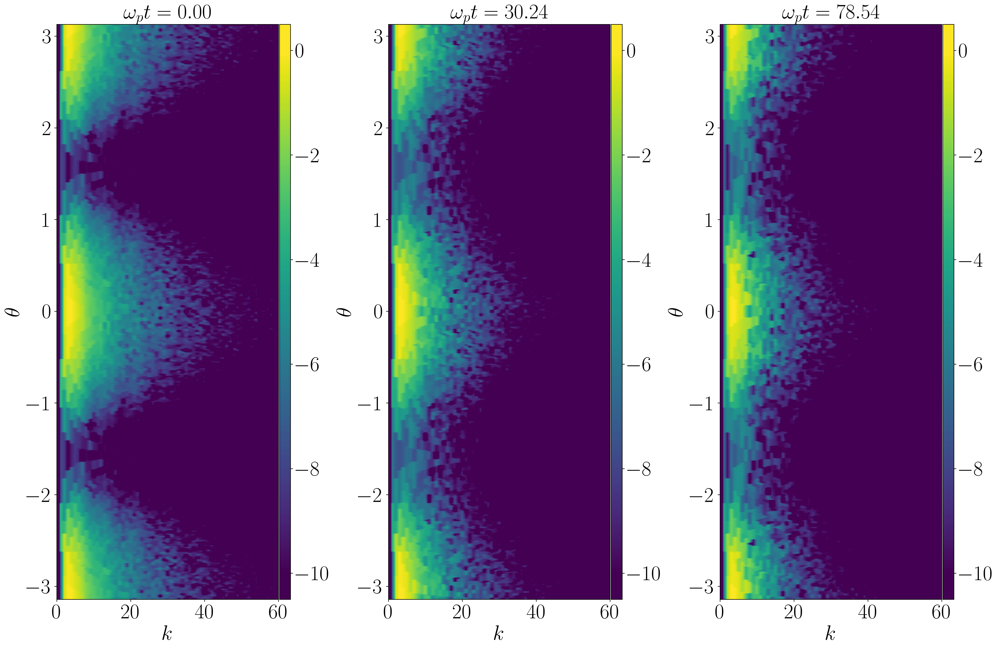

In [15]:
num_rows = 1
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 13))
j = 0

variance =[]
integral = []
polar_integral = []

for i in ind_time:
    eta = eta_series[i]
    
    k, F_center, F_center_polar_integrated , F_center_polar , k_tile, kxp_tile, kyp_tile , theta_tile , theta , variance, integral, polar_integral , kx, ky = spectrum_integration(eta-np.mean(eta), N,L,CHECK=False)
    
    vmin = -10
    vmax= 0
    levels = np.linspace(vmin, vmax, 200)
    
    
    plt.contourf(k_tile,theta_tile,np.log(F_center_polar/np.max(F_center_polar)), levels=levels,  extend='both' )#, cmap='viridis')
    
    ax = axes[j % num_cols]

    im = ax.contourf(k_tile,theta_tile,np.log(F_center_polar/np.max(F_center_polar)), levels=levels ,  extend='both')#, cmap='viridis')
    
    #ax.scatter(4,0,marker ='*', s=1, alpha= 1, c='r' )
    
    ax.set_title(label=r'$\omega_{p} t=%.2f$'%(omegap*(time[i]-tstart)))
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.02)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False', fraction = 0.05, pad = 0.02,aspect =10)
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    #cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    
    ax.set_xlim([0,60])
    ax.set_xlabel('$k$')
    ax.set_ylabel(r"$ \theta $")
    ax.figure.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/Ektheta_{(omegap*(time[i]-tstart))}.png')
    j += 1
    

plt.tight_layout()
#plt.savefig("g1_tend", dpi=300)
plt.show()

# $E(k,t)$

/tmp/ipykernel_1426183/998513671.py:106: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  plt.xlim([0,10])


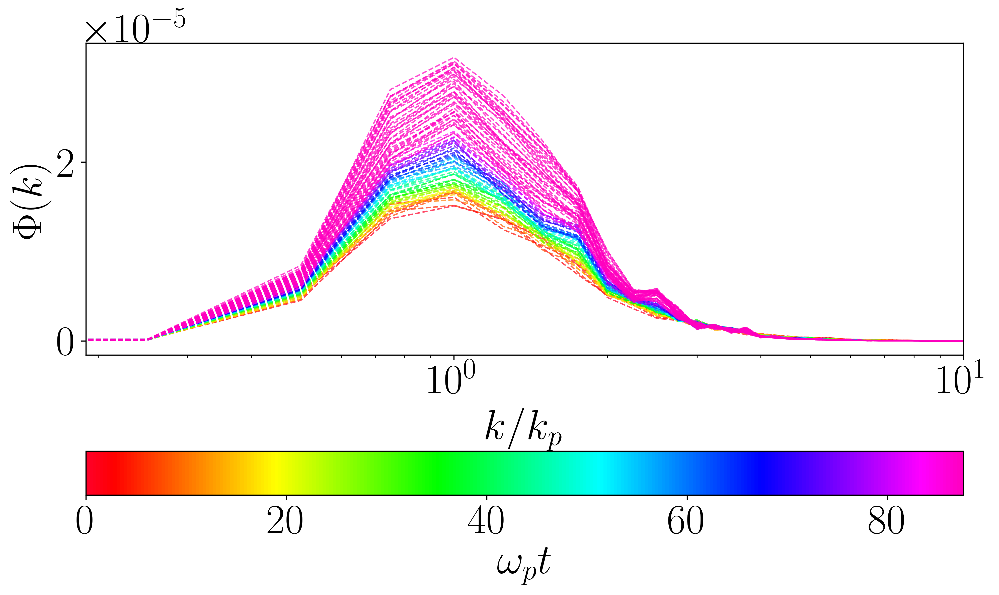

In [16]:
color_map = plt.cm.gist_rainbow
fig = plt.figure(figsize=(10, 6))
ax = fig.gca()

num_rows = 2
num_cols = 3

kp = 4

N = 512
L = 2 * np.pi

j = 0

variance = []
integral = []
polar_integral = []

# modes growth
energy_mode = []
coordx_mode = []
k_second = []

energy_secondmode = []
coordx_secondmode =[]
pylab.rcParams.update(params)

filtered_coordx_mode = []
filtered_energy_mode = []

#Loop in time


for i in range(len(eta_series)):
    eta = eta_series[i]
    #print(i, variance)
    k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, varr, integ, int_pol , kx, ky = spectrum_integration(
        eta - np.mean(eta), N, L, CHECK=False)
    #print('k', k, 'kx', kx[int(len(kx)/2):])
    #k = kx[int(len(kx)/2):]
    dk = k[1] - k[0]
    
    #print(k)
    if i == 0:

        indices1 = np.arange(0, np.where(k >= 1)[0][0], max(1, int(0.25 / dk)))
        indices10 = np.arange(np.where(k >= 1)[0][0], np.where(k >= 10)[0][0], max(1, int(1 / dk)))
        indices1020 = np.arange(np.where(k >= 10)[0][0], np.where(k > 40)[0][0], max(1, int(1 / dk)))
        indices100 = np.arange(np.where(k >= 20)[0][0], np.where(k > 100)[0][0], max(1, int(10/ dk)))
        indicesplus = np.arange(np.where(k >= 100)[0][0], len(k), max(1, int(20 / dk)))

        k_multiples = np.concatenate((indices1, indices10, indices1020 ,indices100, indicesplus))

        k_multiples = k_multiples.astype(int)
        # Obtener los valores de k y las energías correspondientes
        k_seleccionados = k[k_multiples]

    energias_correspondientes = F_center_polar_integrated[k_multiples]
    #k = k/4
    
    if i == 0:
        E0_both = np.sum(F_center_polar_integrated) * dk
        #print(type(indices_cada_diez))
        E0_nodes_both = F_center_polar_integrated[k_multiples]
        #E0_second_both =  F_center_polar_integrated[k_second]
    
    if i % 5 == 0:
        psd = ax.plot(k/4, F_center_polar_integrated, '--', color=plt.cm.get_cmap('gist_rainbow')(j), alpha=0.7, linewidth=1)
    
    energy_mode.append(energias_correspondientes.tolist())
    #coordx_mode.append(coordx.tolist())
    integral.append(integ)
    variance.append(varr)
    polar_integral.append(int_pol)
    
 
    j += 1

# plot where are the nodes

#for km in k_seleccionados:
    #plt.axvline(x=km, color='gray', linestyle='--', linewidth=0.3)
    
#ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
#plt.legend(loc='upper right', fontsize=4)


color_values =  (omegap*(np.array(time)-time[0]))

# Now set the normalization with the correct range

norm = plt.Normalize(vmin=color_values.min(), vmax=color_values.max())
sm = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
sm.set_array([])  

# Add the colorbar to the figure
cbar = plt.colorbar(sm, orientation='horizontal', pad=0.2)

# Set colorbar label and other properties if needed
cbar.set_label('$\omega_{p} t$')


fig.tight_layout()
cbar.set_label('$\omega_{p} t$')
plt.xscale('log')
plt.xlim([0,10])
#plt.ylim([10**-11,10**-3])
#plt.yscale('log')
plt.xlabel('$\mathdefault{k/k_{p}}$')
plt.ylabel('$\mathdefault{\Phi(k)}$')
plt.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/Ek_total.png')
fig.tight_layout()

/tmp/ipykernel_1426183/1258136717.py:120: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  plt.xlim([0,10])


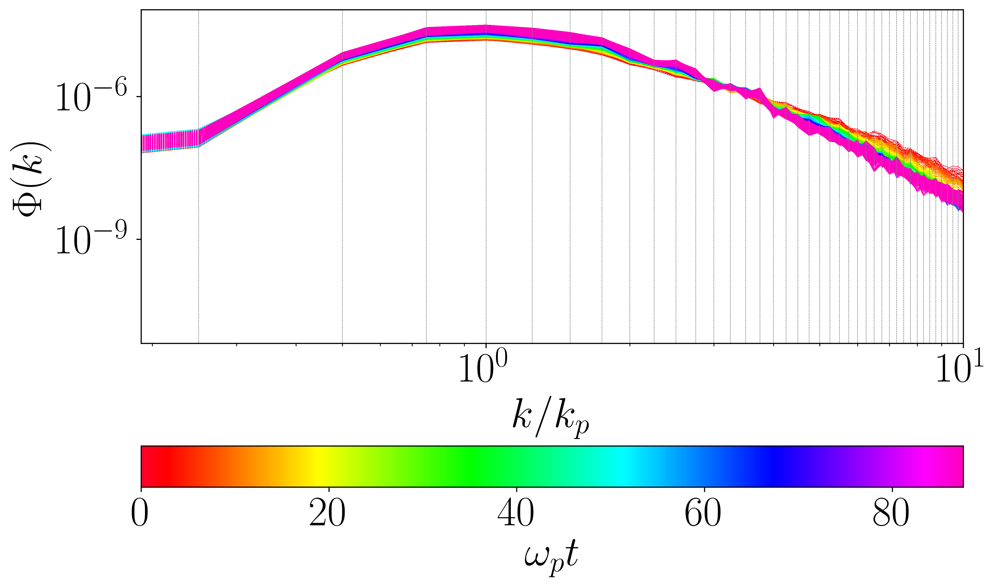

In [33]:
import matplotlib.cm as cm
from scipy.interpolate import interp1d
from scipy import integrate
import csv

fig = plt.figure(figsize=(10, 6))
color_map = plt.cm.gist_rainbow
ax = fig.gca()

num_rows = 2
num_cols = 3

kp = 4

N = 512
L = 2 * np.pi

j = 0

variance = []
integral = []
polar_integral = []

k_seleccionados =[]

# modes growth
energy_interval_time = []
coordx_mode = []
k_second = []

energy_secondmode = []
coordx_secondmode =[]

F_mode =[]
filtered_coordx_mode = []
filtered_energy_mode = []

E_interval = []

with open(f'/projects/DEIKE/cmartinb/eta/eta_series_re720_bo0200_P{kpHs}_uoc{uoc}_reW1.0e5_L10_energies.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    for i in range(len(eta_series)):

        #recorre el tiempo

        eta = eta_series[i]

        k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, varr, integ, int_pol , kx, ky = spectrum_integration(
            eta - np.mean(eta), N, L, CHECK=False)

        E_interval = []

        #print(i)

        for m in range(41):
            if m == 0:
                # Primer punto
                idx_start, idx_end = 0, 1
            elif m == len(k) - 1:
                # Último punto
                idx_start, idx_end = m - 1, m
            else:
                # Puntos intermedios
                idx_start, idx_end = m - 1, m + 1
                
            F_integral_interval = integrate.trapezoid(F_center_polar_integrated[idx_start:idx_end+1], k[idx_start:idx_end+1])
            
            #print('idx start',idx_start, 'idx end', idx_end )
            
            k_seleccionados.append(k[m]) # lista con la energia de cada intervalo [IN .....IN]

            psd = ax.plot(k/4, F_center_polar_integrated, '--', color=plt.cm.get_cmap('gist_rainbow')(j), alpha=0.7, linewidth=0.3)

            #ax.axvline(x = k[m]/4, color = 'grey', alpha =0.3)
            
            #print('k[idx_start]',k[idx_start],'k[idx_end]', k[idx_end])
            
            #print('i',i,'interval' ,k[idx_start:idx_end+1], 'F_center_polar_integrated',F_center_polar_integrated[idx_start:idx_end+1], 'F ingrated interpol', F_integral_interval,'l',m)

            E_interval.append(F_integral_interval)
            
            writer.writerow([i, m, F_integral_interval, omegap*(time[i]-time[0])])
            
            #f.write(interval_str)
        
        energy_interval_time.append(E_interval) #lista con la energia de todos intervalos para cada tiempo [[I1.... IN]_0.....[IN...IN]_N] en tiempo i

        #writer.writerow(E_interval)
        
        
        j += 1

# plot where are the nodes

for km in k_seleccionados:
    ax.axvline(x=km/4, color='gray', linestyle='--', linewidth=0.3)

ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
#plt.legend(loc='upper right', fontsize=4)


color_values =  (omegap*(np.array(time)-time[0]))

# Now set the normalization with the correct range

norm = plt.Normalize(vmin=color_values.min(), vmax=color_values.max())
sm = plt.cm.ScalarMappable(cmap=color_map, norm=norm)
sm.set_array([])  

# Add the colorbar to the figure
cbar = plt.colorbar(sm, orientation='horizontal', pad=0.2)

# Set colorbar label and other properties if needed
cbar.set_label('$\omega_{p} t$')


fig.tight_layout()
cbar.set_label('$\omega_{p} t$')
plt.xscale('log')
plt.xlim([0,10])
#plt.ylim([10**-8,1])
plt.yscale('log')
plt.xlabel('$\mathdefault{k/k_{p}}$')
plt.ylabel('$\mathdefault{\Phi(k)}$')
plt.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/Ek_total.png')
fig.tight_layout()

In [34]:
df = pd.read_csv(f'/projects/DEIKE/cmartinb/eta/eta_series_re720_bo0200_P{kpHs}_uoc{uoc}_reW1.0e5_L10_energies.csv', names=['i', 'k', 'F_integral_interval', 'time'])

In [ ]:
# Crear una columna de grupo para cada 'i' que indique el número de intervalo
df['interval_num'] = df.groupby('i').cumcount()

# Ahora pivotar el DataFrame para que cada fila sea una 'i' y cada columna un intervalo
df_pivot = df.pivot(index='i', columns='interval_num', values='F_integral_interval')

# Si deseas que el DataFrame resultante tenga únicamente los valores de integración sin los índices de intervalos como nombres de columnas
df_pivot.columns = [f'interval_{i}' for i in range(len(df_pivot.columns))]

# Resetea el índice para que 'i' sea una columna normal en lugar de un índice
df_pivot = df_pivot.reset_index()

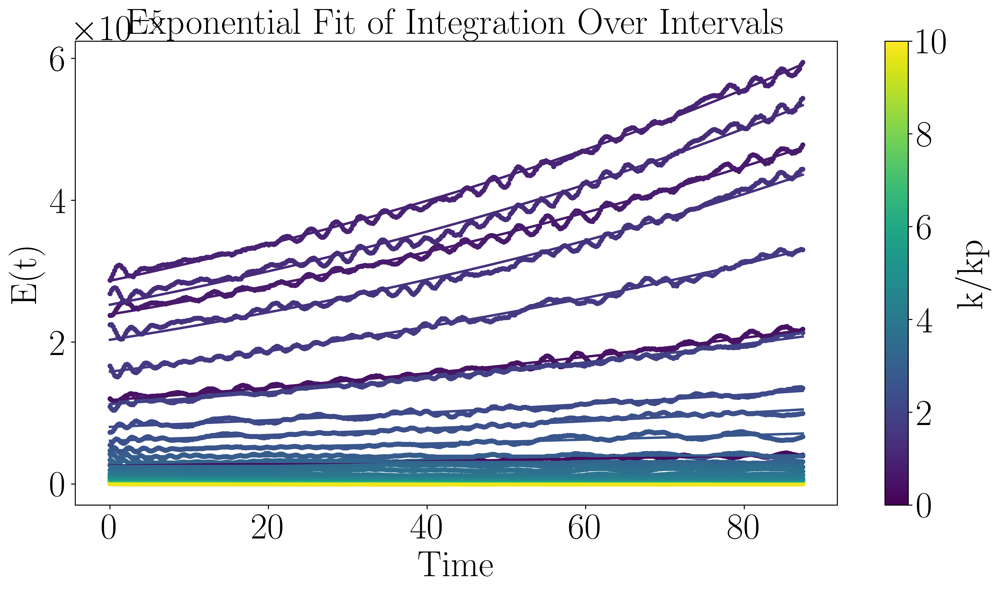

Growth betas: [0.0012721009045718386, 0.005432729147781768, 0.006941358763913677, 0.007845253667858742, 0.008303587937692486, 0.008559824359168178, 0.008732781731474413, 0.008404552196237083, 0.007023723530333811, 0.005597100465227889, 0.006227088401295789, 0.004684498688401054, 0.00043879544803823554, 0.0005583875758712912, 0.0009002997411427226]
Decay betas: [-0.00022494971895383392, -0.0010639691808867944, -0.004484684429823408, -0.00573884884228081, -0.008028914401220218, -0.009350758693721031, -0.009687362963455301, -0.010149290753083393, -0.010594128413425928, -0.010429722042017597, -0.010873914207966585, -0.011834072848660037, -0.013309161979138832, -0.014701060986480477, -0.013845080375180147, -0.013094061552852938, -0.015200492938960846, -0.015288244087195115, -0.013820402874518438, -0.014456018311193591, -0.014310339810039697, -0.013145149689141124, -0.01276620940155676, -0.012999259317867827, -0.01252777143267683, -0.011398186749668566]
Growth k: [0, 1, 2, 3, 4, 5, 6, 7, 8, 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from scipy.optimize import curve_fit

# Asumiendo que 'df_pivot' es tu DataFrame y que 'time' y 'k_seleccionados' están definidos
colormap = cm.viridis
normalize = plt.Normalize(vmin=0, vmax=(len(df_pivot.columns) - 2)/4)  # normalizar basado en el número de intervalos

# Crear una figura y un eje para el ploteo
fig, ax = plt.subplots(figsize=(14, 7))

# Definir la función del modelo exponencial
def exp_model(x, a, b):
    return a * np.exp(b * x)

# Crear listas para almacenar los parámetros de crecimiento y decadencia
beta_growth = []
beta_decay = []

k_growth = []
k_decay = []

# Iterar sobre cada intervalo y realizar ajuste exponencial
for idx, column in enumerate(df_pivot.columns[1:]):  # Ignora la primera columna que es 'i'
    # Extraer datos para el intervalo actual
    mode_total_norm = df_pivot[column].dropna()  # Eliminar valores NaN por seguridad
    tiempo_valido = omegap*(time[:len(mode_total_norm)-1]-tstart)  # Asegurar que tiempo y mode_total_norm tengan la misma longitud
    
    mode_total_norm = mode_total_norm[:-1]
    
    # Ajuste exponencial solo si todos los valores son positivos y hay suficientes datos
    if len(mode_total_norm) > 1 and np.all(mode_total_norm > 0):
        popt, pcov = curve_fit(exp_model, tiempo_valido, mode_total_norm, p0=(1, 0.001), maxfev=100000)
        a, b = popt
        if b > 0:
            beta_growth.append(b)
            k_growth.append(idx)
        else:
            beta_decay.append(b)
            k_decay.append(idx)
        
        # Realizar gráfico para cada intervalo
        color = cm.viridis(idx / len(df_pivot.columns[1:]))  # Normalizar color
        ax.scatter(tiempo_valido, mode_total_norm, color=color, s=10)
        ax.plot(tiempo_valido, exp_model(tiempo_valido, *popt), color=color, lw=2)

# Configurar gráfico
ax.set_xlabel('Time')
ax.set_ylabel('E(t)')
ax.set_title('Exponential Fit of Integration Over Intervals')
plt.colorbar(cm.ScalarMappable(norm=normalize, cmap=colormap), label='k/kp')
#plt.legend()
plt.show()

# Imprimir los valores de beta para crecimiento y decadencia
print("Growth betas:", beta_growth)
print("Decay betas:", beta_decay)
print("Growth k:", k_growth)

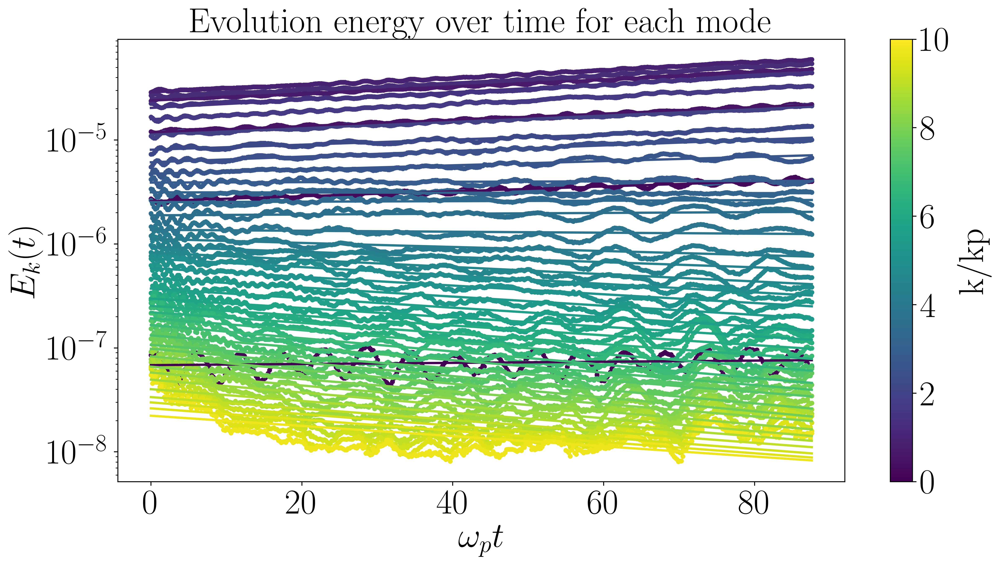

Growth betas: [0.001249938072681768, 0.00542517970460222, 0.006943534114547906, 0.007847750639444883, 0.008304788523135945, 0.00856376373428934, 0.008735714599867729, 0.008402503879914777, 0.007028802009080596, 0.005603847895033616, 0.006216759450852536, 0.004673590798670795, 0.00044173020494446145, 0.000541743551988416, 0.0008766421219066161]
Decay betas: [-0.00022177361138656773, -0.0010648564300006652, -0.004480647746802982, -0.005735218321632778, -0.008013186000723867, -0.009332263836713662, -0.009654359992335758, -0.010109827092886266, -0.010569062722244529, -0.010408798288239823, -0.010843075511423552, -0.011795576248206104, -0.013256894168765998, -0.014639571083146513, -0.013786408453930905, -0.013019182575020471, -0.01510654893431656, -0.015206579072411753, -0.013754121819683532, -0.0143865508081612, -0.014235649585619573, -0.013058559606854843, -0.012660204801151058, -0.012898259864856643, -0.012440376470442875, -0.01130008411205227]
Growth k: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10

In [ ]:

# Asumiendo que 'df_pivot' es tu DataFrame y que 'time' y 'k_seleccionados' están definidos
colormap = cm.viridis
normalize = plt.Normalize(vmin=0, vmax=(len(df_pivot.columns) - 2)/4)  # normalizar basado en el número de intervalos

# Crear una figura y un eje para el ploteo
fig, ax = plt.subplots(figsize=(14, 7))

# Definir la función del modelo exponencial
def exp_model(x, a, b):
    return a * np.exp(b * x)

# Crear listas para almacenar los parámetros de crecimiento y decadencia
beta_growth = []
beta_decay = []

k_growth = []
k_decay = []

# Iterar sobre cada intervalo y realizar ajuste exponencial
for idx, column in enumerate(df_pivot.columns[1:]):  # Ignora la primera columna que es 'i'
    # Extraer datos para el intervalo actual
    mode_total_norm = df_pivot[column].dropna()  # Eliminar valores NaN por seguridad
    tiempo_valido = omegap*(time[:len(mode_total_norm)]-tstart)  # Asegurar que tiempo y mode_total_norm tengan la misma longitud
    
    # Ajuste exponencial solo si todos los valores son positivos y hay suficientes datos
    if len(mode_total_norm) > 1 and np.all(mode_total_norm > 0):
        popt, pcov = curve_fit(exp_model, tiempo_valido, mode_total_norm, p0=(1, 0.001), maxfev=10000)
        a, b = popt
        if b > 0:
            beta_growth.append(b)
            k_growth.append(idx)
        else:
            beta_decay.append(b)
            k_decay.append(idx)
        
        # Realizar gráfico para cada intervalo
        color = cm.viridis(idx / len(df_pivot.columns[1:]))  # Normalizar color
        ax.scatter(tiempo_valido, mode_total_norm, color=color, s=10)
        ax.plot(tiempo_valido, exp_model(tiempo_valido, *popt), color=color, lw=2)

# Configurar gráfico
ax.set_xlabel(r'$\omega_{p} t$')
ax.set_ylabel(r'$E_{k}(t)$')
ax.set_title('Evolution energy over time for each mode')
plt.colorbar(cm.ScalarMappable(norm=normalize, cmap=colormap), label='k/kp')
#plt.legend()

plt.yscale('log')

plt.show()
# Imprimir los valores de beta para crecimiento y decadencia
print("Growth betas:", beta_growth)
print("Decay betas:", beta_decay)
print("Growth k:", k_growth)
print("Decay k:", k_decay)

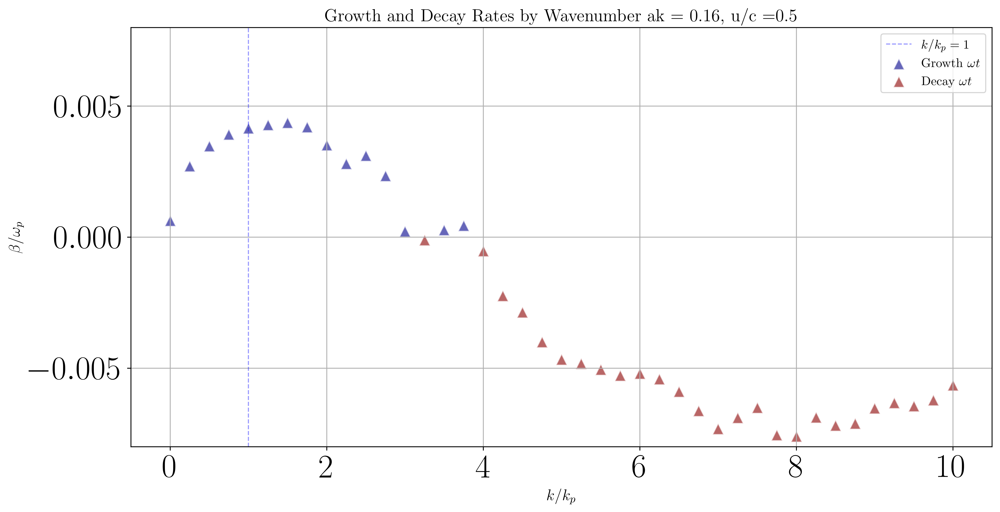

In [ ]:
fig, ax = plt.subplots(figsize=(14, 7))
plt.scatter([k/4 for k in k_growth], [beta/omegap for beta in beta_growth], c='darkblue', marker= "^", label=r'Growth $\omega t$', alpha=0.6, edgecolors='w', s=100)
plt.scatter([k/4 for k in k_decay], [beta/omegap for beta in beta_decay], c='darkred', marker= "^", label=r'Decay $\omega t$ ', alpha=0.6, edgecolors='w', s=100)
# Añadir etiquetas y título
plt.xlabel(r'$k/k_p$', fontsize=14)
plt.ylabel(r'$\beta / \omega_{p}$', fontsize=14)
#plt.title(f'Growth and Decay Rates by Wavenumber ak = {ak}, u/c =0.5', fontsize=16)
plt.axvline(x=1, color='blue', linestyle='--', linewidth=1, alpha= 0.4,  label=r'$k/k_{p}=1$')
# Añadir leyenda
plt.legend()

# Añadir cuadrícula para mejor visualización
plt.grid(True)

# Ajustar límites si es necesario
#plt.xlim([-0.2, 0.2])
plt.ylim([-0.008, 0.008])

# Mostrar el gráfico
plt.show()

#### Save betas in Data Frame so we can compare different cases

In [35]:
import pandas as pd
import numpy as np

# Creation Df for growth and decay
df_growth = pd.DataFrame({
    'Tipo': 'Growth',
    'Beta': beta_growth,
    'k': k_growth
})

df_decay = pd.DataFrame({
    'Tipo': 'Decay',
    'Beta': beta_decay,
    'k': k_decay
})

df_beta = pd.concat([df_growth, df_decay], axis=0).reset_index(drop=True)

# Guardar el DataFrame combinado en un archivo CSV
df_beta.to_csv(f'/projects/DEIKE/cmartinb/betas/betas_re720_bo0200_P{kpHs}_uoc{uoc}_reW1.0e5_L10_.csv', index=False)

#### Different modes

In [ ]:
beta_growth = []
beta_decay = []
k_growth = []
k_decay = []

tiempos_minimos = []
kp_minimos = []

sse_values =[]
r2_values =[]

slopes_exp =[]
slopes_exp_decay =[]

for idx, column in enumerate(df_pivot.columns[1:]):
    mode_total_norm = df_pivot[column].values
    # Start a new figure for each mode
    fig, ax = plt.subplots(figsize=[5, 3])
    color = cm.viridis(idx / len(df_pivot.columns[1:]))
    
    
    tiempo = omegap*(time-tstart)
    
    ax.plot(tiempo, mode_total_norm, '-', color=color, lw=0.5, label=f'mode k/kp = {idx/kp:.2f}')
    ax.scatter(tiempo, mode_total_norm, color=color, s=0.5, alpha=0.7)
    
    # Exponential fit
    p = np.polyfit(tiempo, np.log(mode_total_norm), 1)
    a = np.exp(p[1])
    b = p[0]
    y_exponential = a * np.exp(b * tiempo)
    
    slope = b
    
    concavity = "upwards" if b > 0 else "downwards"
    
    # Calculate SSR and R^2 for exponential fit
    residuals_exp = mode_total_norm - y_exponential
    ssr_exp = np.sum(residuals_exp ** 2)
    sst_exp = np.sum((mode_total_norm - np.mean(mode_total_norm)) ** 2)
    r2_exp = 1 - (ssr_exp / sst_exp)
    
    if r2_exp > 0.8:
    
        if b>0:
            print('1')
            beta_growth.append(b)
            k_growth.append(idx / kp)
            print(idx / kp)
        else:
            print('2')
            beta_decay.append(b)
            k_decay.append(idx / kp)
            print(idx / kp)
    
    # Append to lists
    sse_values.append(ssr_exp)
    r2_values.append(r2_exp)
    
    # Check if the R^2 value is below the threshold
    if r2_exp < 0.8:
        #print('entra')
        # Perform a parabolic fit
        #print('tiempo', tiempo)
        coefficients_parabola = np.polyfit(tiempo, mode_total_norm, 2)
        y_parabola = np.polyval(coefficients_parabola, tiempo)
        
        a_parabola, b_parabola, c_parabola = coefficients_parabola
        
        concavity = "upwards" if a > 0 else "downwards"
        
        if a != 0:  # a different of zero so we don't divide by zero
            x_minimo = - b_parabola / (2 * a_parabola) 
            print('x minimo',x_minimo)
            y_minimo = np.polyval(coefficients_parabola, x_minimo)
            if (x_minimo>tiempo[0]) & (x_minimo<tiempo[-1]):
                plt.plot(x_minimo, y_minimo, 'go', label='Minimum')
        else:
            x_minimo = None
            y_minimo = None

        concavity = "upwards" if a_parabola > 0 else "downwards"
        
        # verify is critical point is in the proper interval
        if x_minimo > tiempo[0] and x_minimo < tiempo[-1]:
            # Divide data around this critical point 
            left_mask = tiempo < x_minimo
            right_mask = tiempo > x_minimo
            
            if left_mask.any():
                p_left = np.polyfit(tiempo[left_mask], np.log(mode_total_norm[left_mask]), 1)
                a_left = np.exp(p_left[1])
                b_left = p_left[0]
                y_left_exp = a_left * np.exp(b_left * tiempo[left_mask])
                ax.plot(tiempo[left_mask], y_left_exp, 'm--', label='Left exponential fit')
                if b_left > 0:
                    beta_growth.append(b_left)
                    k_growth.append(idx / kp)
                else:
                    beta_decay.append(b_left)
                    k_decay.append(idx / kp)

            # Right segment
            if right_mask.any():
                p_right = np.polyfit(tiempo[right_mask], np.log(mode_total_norm[right_mask]), 1)
                a_right = np.exp(p_right[1])
                b_right = p_right[0]
                y_right_exp = a_right * np.exp(b_right * tiempo[right_mask])

                if b_right > 0:
                    beta_growth.append(b_right)
                    k_growth.append(idx/ kp)
                else:
                    beta_decay.append(b_right)
                    k_decay.append(idx / kp)

                
                ax.plot(tiempo[right_mask], y_right_exp, 'y--', label='Right exponential fit')
        else: # If not take exp fit 
            if b>0:
                print('7')
                beta_growth.append(b)
                k_growth.append(idx / kp)
                print(idx/ kp)
                    
            else:
                print('8')
                beta_decay.append(b)
                k_decay.append(idx/ kp)
                print(idx / kp)
           
        # Calculate residuals for the parabolic fit
        residuals_parabola = mode_total_norm - y_parabola
        rmse = np.sqrt(np.mean(residuals_parabola**2))
        
        ssr_parab= np.sum(residuals_parabola ** 2)
        sst_parab = np.sum((mode_total_norm - np.mean(mode_total_norm)) ** 2)
        r2_parab = 1 - (ssr_parab / sst_parab)
        
        # Plot the parabolic fit
        plt.plot(tiempo, y_parabola, 'b--', label='Parabolic fit')
        ax.plot(tiempo, y_exponential, 'r--', label='Exponential fit')
        plt.legend()
        #plt.xscale('log')
        plt.yscale('log')
        plt.xlabel('$\omega_{p} t$')
        plt.ylabel('$E(t)$')
        
        
        x0, xmax = plt.xlim()
        y0, ymax = plt.ylim()
        data_width = xmax - x0
        data_height = ymax - y0
        plt.text(x0 + 0.1, y0+0.000000001, f'$t \omega$ = {x_minimo:2f}')
        
        tiempos_minimos.append(x_minimo)
        kp_minimos.append(idx/kp)
        
        plt.show()
        # Print the results
        print(f'Parabolic fit: k/kp = {idx/kp:.2f},SSE = {ssr_parab:.2e}, R^2 = {r2_parab:.5f}', r'time where behaviour changes $\omega t$', x_minimo )
        print(f'RMSE of parabolic fit: {rmse:.5f}')
        print('a',a,'b',b)

        
    else:
        ax.plot(tiempo, y_exponential, 'r--', label='Exponential fit')
    
    print(beta_growth,beta_decay,k_growth,k_decay)
    
    ax.set_xlabel('$\omega_{p} t$')
    ax.set_ylabel('$E(t)$')
    ax.set_yscale('log')
    #ax.set_xscale('log')
    ax.legend(fontsize="7")
    ax.grid(True)
    plt.show()
    
    print(f'Exponential fit: k/kp = {idx/kp:.2f}, slope = {slope:.5f}, SSE = {ssr_exp:.2e}, R^2 = {r2_exp:.5f}')

    if slope < 0:
        slopes_exp_decay.append(slope)
        k_decay.append(idx)
    
    slopes_exp.append(slope)

#### Here we save a file with times and k caracteristic: where behavior is only the first, not changing the behavior.


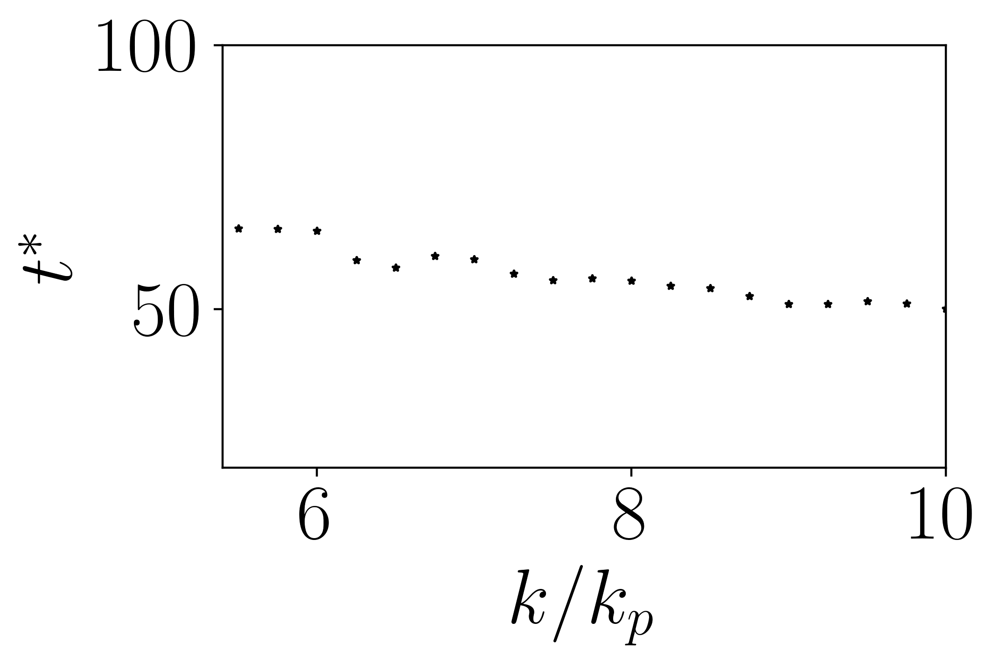

In [37]:
fig = plt.figure(figsize=[5, 3])
plt.scatter(kp_minimos,tiempos_minimos, s =6, marker ="*", color='black')
#plt.axhline(y = 80, color = 'r', linestyle = '--', lw = 0.3) 
#plt.axhline(y = 0, color = 'r', linestyle = '--', lw = 0.3) 
plt.ylabel(r'$t^{*}$')
plt.xlabel(r'$k/k_{p}$')
plt.ylim([20,100])
plt.xlim([5.4,10])


# Crear un DataFrame con los datos
df_datos = pd.DataFrame({
    'kp_minimos': kp_minimos,
    'tiempos_minimos': tiempos_minimos
})

# Guardar en CSV
df_datos.to_csv(f'/projects/DEIKE/cmartinb/datos/datos_re720_bo0200_P{kpHs}_uoc{uoc}_reW1.0e5_L10.csv', index=False)